In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from Bio import SeqIO
from numba import njit

def merge_sequences_from_fasta(file_path):
    sequences = []  # List to store all sequences
    for record in SeqIO.parse(file_path, "fasta"):
        # `record.seq` gives the sequence
        sequences.append(str(record.seq))
    return "".join(sequences)

@njit
def generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix):
    for i in range(start1, end1):
        for j in range(start2, end2):
            if seq1[i] == seq2[j]:
                matrix[i - start1, j - start2] = 1

# Folder to save the dot plot images
output_folder = "dot_plots"
os.makedirs(output_folder, exist_ok=True)

# Rutas de archivo
file_path_1 = "Data/E_coli.fna"
file_path_2 = "Data/Salmonella.fna"

# Cargar secuencias
seq1 = merge_sequences_from_fasta(file_path_1)
seq2 = merge_sequences_from_fasta(file_path_2)

# Definir el número de secciones en las que se dividirán las secuencias
num_sections = 1000
# Calcular el tamaño de cada sección
section_size1 = len(seq1) // num_sections
section_size2 = len(seq2) // num_sections

# Procesar cada sección de las secuencias
for i in range(num_sections):
    start1 = i * section_size1
    end1 = (i + 1) * section_size1
    start2 = i * section_size2
    end2 = (i + 1) * section_size2
    
    matrix = np.zeros((end1 - start1, end2 - start2), dtype=np.uint8)
    generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix)
    
    plt.imshow(matrix, cmap='Greys', aspect='auto')
    plt.xlabel('Sequence 2')
    plt.ylabel('Sequence 1')
    plt.title('Part {}'.format(i + 1))
    
    # Save the image in the output folder with a unique filename
    filename = os.path.join(output_folder, 'dotplot_{}.png'.format(i + 1))
    plt.savefig(filename)
    
    # Clear the current figure to avoid overlapping plots
    plt.clf()
    plt.close()

print("Dot plot images saved in the '{}' folder.".format(output_folder))

In [ ]:
import os
import svgwrite

# Tamaño de cada cuadrante
quadrant_size = (100, 100)

# Tamaño final de la imagen combinada
final_size = (4000, 4000)

# Crea un objeto SVG
dwg = svgwrite.Drawing("combined_image.svg", size=final_size)

# Ruta de la carpeta que contiene las imágenes individuales
folder_path = "imagesprueba3"

# Obtén la lista de archivos en la carpeta y ordénalos numéricamente
files = sorted(os.listdir(folder_path), key=lambda x: int(x.split("_")[1].split(".")[0]))

# Itera sobre cada archivo de imagen y añádelo al archivo SVG
for i, file_name in enumerate(files):
    # Obtén la ruta completa del archivo de imagen
    file_path = os.path.join(folder_path, file_name)

    # Calcula las coordenadas del cuadrante correspondiente
    x = i * quadrant_size[0] % final_size[0]
    y = (i * quadrant_size[0] // final_size[0]) * quadrant_size[1]

    # Agrega la imagen como un elemento SVG
    dwg.add(dwg.image(href=file_path, insert=(x, y), size=quadrant_size))

# Guarda el archivo SVG
dwg.save()

In [11]:
import os
import matplotlib.pyplot as plt
import numpy as np
from Bio import SeqIO
from numba import njit
from tqdm import tqdm

def merge_sequences_from_fasta(file_path):
    sequences = []  # List to store all sequences
    for record in SeqIO.parse(file_path, "fasta"):
        # `record.seq` gives the sequence
        sequences.append(str(record.seq))
    return "".join(sequences)


def generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix):
    n_secuencia1 = np.array(seq1[start1:end1])
    n_secuencia2 = np.array(seq2[start2:end2])
    matches = np.equal(n_secuencia1[:, None], n_secuencia2)
    matrix[:matches.shape[0], :matches.shape[1]] = matches.astype(np.uint8)

# Folder to save the dot plot images
output_folder = "imagesgonorrea"
os.makedirs(output_folder, exist_ok=True)

# Rutas de archivo
file_path_1 = "Data/E_coli.fna"
file_path_2 = "Data/Salmonella.fna"

# Cargar secuencias
seq1 = merge_sequences_from_fasta(file_path_1)
seq2 = merge_sequences_from_fasta(file_path_2)

# Definir el número de secciones en las que se dividirán las secuencias
num_sections = 1000
# Calcular el tamaño de cada sección
section_size1 = len(seq1) // num_sections
section_size2 = len(seq2) // num_sections

# Procesar cada sección de las secuencias
for i in tqdm(range(num_sections)):
    start1 = i * section_size1
    end1 = (i + 1) * section_size1
    start2 = i * section_size2
    end2 = (i + 1) * section_size2
    
    matrix = np.zeros((section_size1, section_size2), dtype=np.uint8)
    generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix)
    
    plt.imshow(matrix, cmap='Greys', aspect='auto')
    plt.xlabel('Sequence 2')
    plt.ylabel('Sequence 1')
    plt.title('Part {}'.format(i + 1))
    
    # Save the image in the output folder with a unique filename
    filename = os.path.join(output_folder, 'dotplot_{}.png'.format(i + 1))
    plt.savefig(filename)
    
    # Clear the current figure to avoid overlapping plots
    plt.clf()
    plt.close()

print("Dot plot images saved in the '{}' folder.".format(output_folder))

  0%|          | 0/1000 [00:00<?, ?it/s]


IndexError: too many indices for array: array is 0-dimensional, but 1 were indexed

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
from Bio import SeqIO

def merge_sequences_from_fasta(file_path):
    sequences = []  # List to store all sequences
    for record in SeqIO.parse(file_path, "fasta"):
        # `record.seq` gives the sequence
        sequences.append(str(record.seq))
    return "".join(sequences)


def generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix):
    for i in range(start1, end1):
        for j in range(start2, end2):
            if seq1[i] == seq2[j]:
                matrix[i - start1, j - start2] = 1


# Folder to save the dot plot images
output_folder = "images6"
os.makedirs(output_folder, exist_ok=True)

# File paths
file_path_1 = "Data/E_coli.fna"
file_path_2 = "Data/Salmonella.fna"

# Load sequences
seq1 = merge_sequences_from_fasta(file_path_1)
seq2 = merge_sequences_from_fasta(file_path_2)

# Define the number of sections for seq1
num_sections_seq1 = 1000
section_size_seq1 = len(seq1) // num_sections_seq1

# Define the number of sections for seq2
num_sections_seq2 = len(seq2) // section_size_seq1

# Process each section of seq1
for i in range(num_sections_seq1):
    start1 = i * section_size_seq1
    end1 = (i + 1) * section_size_seq1

    # Process each section of seq2 for the current seq1 section
    for j in range(num_sections_seq2):
        start2 = j * section_size_seq1
        end2 = (j + 1) * section_size_seq1

        matrix = np.zeros((section_size_seq1, section_size_seq1), dtype=np.uint8)
        generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix)

        plt.imshow(matrix, cmap='Greys', aspect='auto')
        plt.xlabel('Sequence 2')
        plt.ylabel('Sequence 1')
        plt.title('Part {} vs Part {}'.format(i + 1, j + 1))

        # Save the image in the output folder with a unique filename
        filename = os.path.join(output_folder, 'dotplot_{}_{}.png'.format(i + 1, j + 1))
        plt.savefig(filename)

        # Clear the current figure to avoid overlapping plots
        plt.clf()
        plt.close()

print("Dot plot images saved in the '{}' folder.".format(output_folder))

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\Heosve\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\Heosve\AppData\Local\Temp\ipykernel_4996\3193494280.py", line 51, in <module>
    generate_dotplot_seq(seq1, seq2, start1, end1, start2, end2, matrix)
  File "C:\Users\Heosve\AppData\Local\Temp\ipykernel_4996\3193494280.py", line -1, in generate_dotplot_seq
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\Heosve\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py", line 2105, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

In [1]:
%pip install tqm

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement tqm (from versions: none)
ERROR: No matching distribution found for tqm

[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: C:\Users\Heosve\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [15]:
import os
import matplotlib.pyplot as plt
import numpy as np
from Bio import SeqIO
from tqdm import tqdm

# Function to merge sequences from a FASTA file
def merge_sequences_from_fasta(file_path):
    sequences = []  # List to store all sequences
    for record in SeqIO.parse(file_path, "fasta"):
        sequences.append(str(record.seq))
    return "".join(sequences)

# Function to generate the dot plot for a given segment pair
def generate_dotplot(segment1, segment2, matrix):
    for i in range(len(segment1)):
        for j in range(len(segment2)):
            if segment1[i] == segment2[j]:
                matrix[i, j] += 1

# File paths
file_path_1 = "Data/E_coli.fna"
file_path_2 = "Data/Salmonella.fna"

# Load sequences
seq1 = merge_sequences_from_fasta(file_path_1)
seq2 = merge_sequences_from_fasta(file_path_2)

# Define segment size
segment_size = 4000

# Calculate the number of segments
num_segments1 = len(seq1) // segment_size
num_segments2 = len(seq2) // segment_size

# Create the alignment matrix
alignment_matrix = np.zeros((segment_size, segment_size), dtype=np.uint32)

# Process each segment of the sequences
for i in tqdm(range(num_segments1)):
    start1 = i * segment_size
    end1 = start1 + segment_size
    segment1 = seq1[start1:end1]

    for j in range(num_segments2):
        start2 = j * segment_size
        end2 = start2 + segment_size
        segment2 = seq2[start2:end2]

        # Generate the dot plot for the segment pair
        generate_dotplot(segment1, segment2, alignment_matrix)

# Average the alignment matrix
alignment_matrix /= (num_segments1 * num_segments2)

# Generate the dot plot image
plt.imshow(alignment_matrix, cmap='Greys', aspect='auto')
plt.xlabel('Sequence 2')
plt.ylabel('Sequence 1')
plt.title('Dot Plot')
plt.savefig('dotplot.png')
plt.close()

print("Dot plot image saved as 'dotplot.png'.")



  0%|          | 0/1160 [25:58<?, ?it/s]

Unexpected exception formatting exception. Falling back to standard exception



Traceback (most recent call last):
  File "C:\Users\Heosve\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\Heosve\AppData\Local\Temp\ipykernel_7356\1105267392.py", line 51, in <module>
    generate_dotplot(segment1, segment2, alignment_matrix)
  File "C:\Users\Heosve\AppData\Local\Temp\ipykernel_7356\1105267392.py", line -1, in generate_dotplot
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\Heosve\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py", line 2105, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\

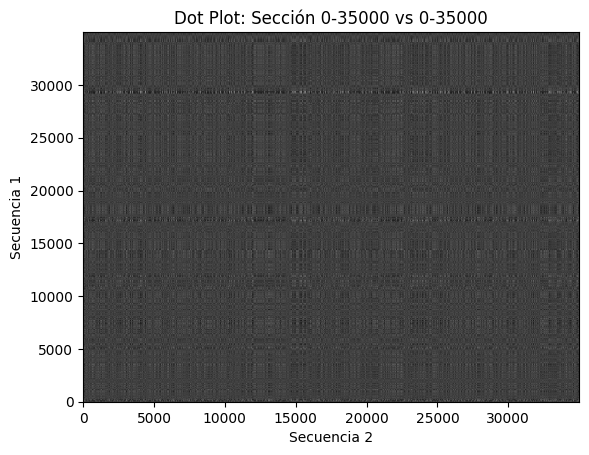

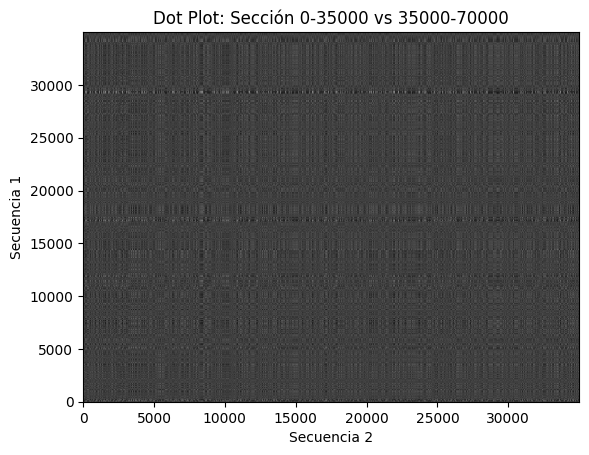

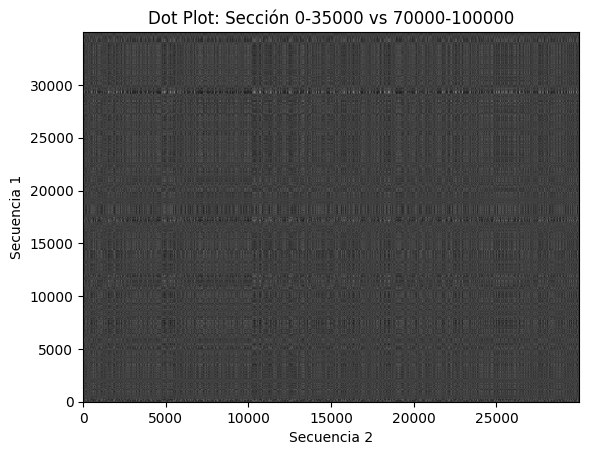

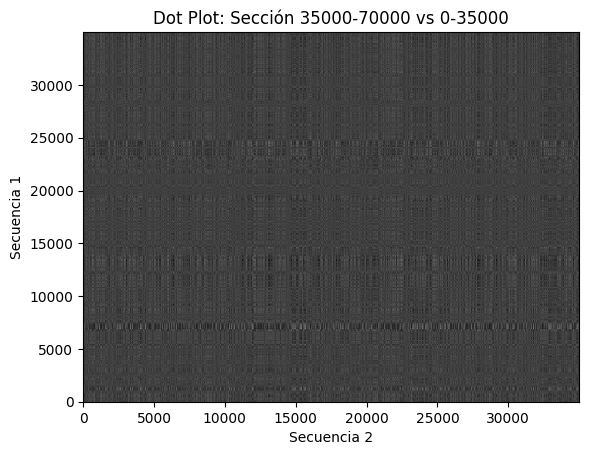

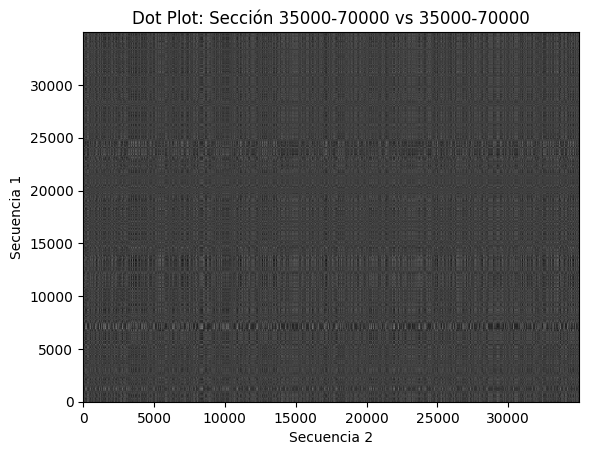

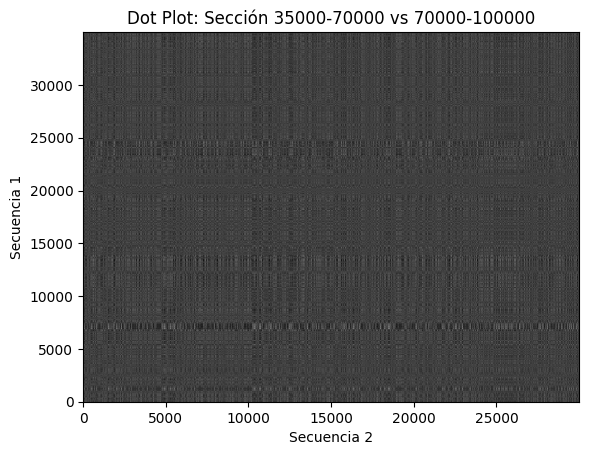

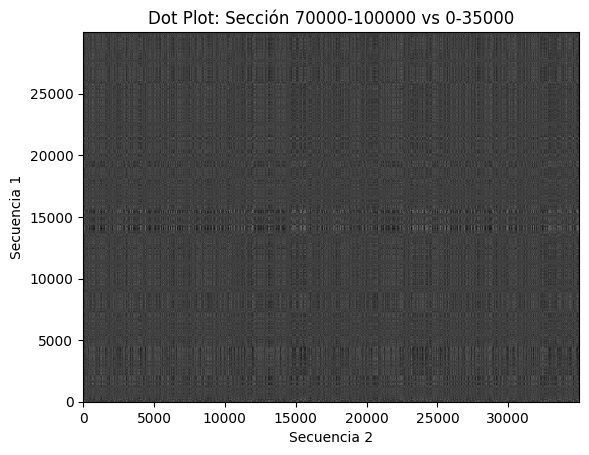

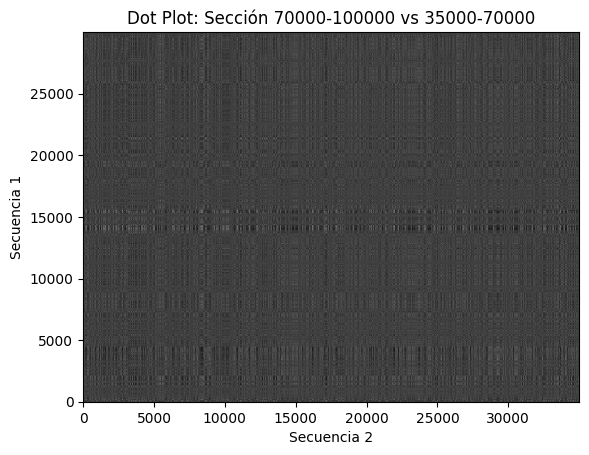

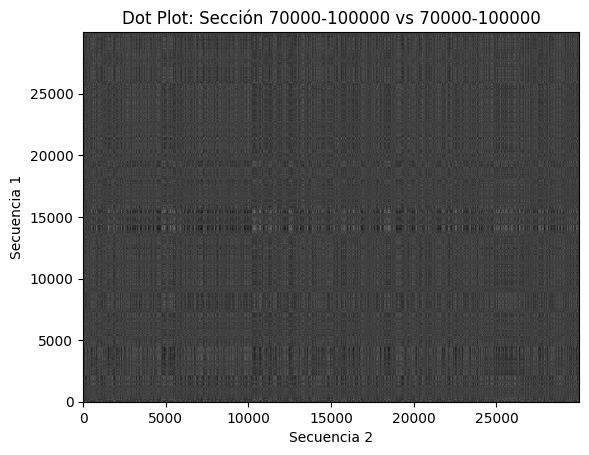

MemoryError: Unable to allocate 1.14 GiB for an array with shape (35000, 35000) and data type int8

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from Bio import SeqIO

def create_dot_plot(seq1, seq2, window_size):
    length1 = len(seq1)
    length2 = len(seq2)

    dot_plot = np.zeros((length1, length2), dtype=np.int8)

    for i in range(0, length1, window_size):
        for j in range(0, length2, window_size):
            start_i = i
            end_i = min(i + window_size, length1)
            start_j = j
            end_j = min(j + window_size, length2)

            section1 = np.array(list(seq1[start_i:end_i]))
            section2 = np.array(list(seq2[start_j:end_j]))

            match_matrix = section1[:, np.newaxis] == section2
            dot_plot[start_i:end_i, start_j:end_j] = match_matrix.astype(np.int8)

            # Graficar el dot plot de la sección actual
            plt.imshow(dot_plot[start_i:end_i, start_j:end_j], cmap='gray', aspect='auto', origin='lower')
            plt.title(f"Dot Plot: Sección {start_i}-{end_i} vs {start_j}-{end_j}")
            plt.xlabel("Secuencia 2")
            plt.ylabel("Secuencia 1")
            plt.show()

    return dot_plot

# Rutas de los archivos fasta
file1 = "Data/E_coli.fna"
file2 = "Data/Salmonella.fna"

# Tamaño de la ventana deslizante
window_size = 35000

# Lee las secuencias de los archivos fasta y limita su tamaño
sequences1 = [str(record.seq[:100000]) for record in SeqIO.parse(file1, "fasta")]
sequences2 = [str(record.seq[:100000]) for record in SeqIO.parse(file2, "fasta")]

# Itera sobre las secuencias
for sequence1 in sequences1:
    for sequence2 in sequences2:
        # Calcula el dot plot por secciones para cada par de secuencias
        dot_plot = create_dot_plot(sequence1, sequence2, window_size)
        # Realiza las operaciones necesarias con el dot plot obtenido  

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from Bio import SeqIO
import time

def create_dot_plot(seq1, seq2, window_size):
    length1 = len(seq1)
    length2 = len(seq2)

    dot_plot = np.zeros((length1, length2), dtype=np.int8)

    for i in range(0, length1, window_size):
        for j in range(0, length2, window_size):
            start_i = i
            end_i = min(i + window_size, length1)
            start_j = j
            end_j = min(j + window_size, length2)

            section1 = np.array(list(seq1[start_i:end_i]))
            section2 = np.array(list(seq2[start_j:end_j]))

            match_matrix = section1[:, np.newaxis] == section2
            dot_plot[start_i:end_i, start_j:end_j] = match_matrix.astype(np.int8)

            # Graficar el dot plot de la sección actual
            plt.imshow(dot_plot[start_i:end_i, start_j:end_j], cmap='gray', aspect='auto', origin='lower')
            plt.title(f"Dot Plot: Sección {start_i}-{end_i} vs {start_j}-{end_j}")
            plt.xlabel("Secuencia 2")
            plt.ylabel("Secuencia 1")
            plt.show()

    return dot_plot

# Rutas de los archivos fasta
file1 = "Data/E_coli.fna"
file2 = "Data/Salmonella.fna"

# Tamaño de la ventana deslizante
window_size = 35000

# Lee las secuencias de los archivos fasta y limita su tamaño
sequences1 = [str(record.seq[:50000]) for record in SeqIO.parse(file1, "fasta")]
sequences2 = [str(record.seq[:50000]) for record in SeqIO.parse(file2, "fasta")]

# Medición de tiempos
start_total = time.time()

for sequence1 in sequences1:
    for sequence2 in sequences2:
        start_parallel = time.time()

        # Calcula el dot plot por secciones para cada par de secuencias
        dot_plot = create_dot_plot(sequence1, sequence2, window_size)

        end_parallel = time.time()

        # Realiza las operaciones necesarias con el dot plot obtenido

        # Tiempos parciales
        time_parallel = end_parallel - start_parallel
        time_total = end_parallel - start_total

        # Tiempo de carga de datos y generación de la imagen
        time_data_load = time_parallel
        time_image_generation = time_parallel

        # Tiempo muerto (despreciable en este caso)
        time_idle = 0

        # Aceleración y eficiencia
        acceleration = time_total / time_parallel
        efficiency = acceleration / multiprocessing.cpu_count()

        # Escalabilidad (despreciable en este caso)
        scalability = 1

        print("Tiempos:")
        print("  Total:", time_total)
        print("  Paralelo:", time_parallel)
        print("  Carga de datos:", time_data_load)
        print("  Generación de imagen:", time_image_generation)
        print("  Tiempo muerto:", time_idle)
        print("Aceleración:", acceleration)
        print("Eficiencia:", efficiency)
        print("Escalabilidad:", scalability)
        print("\n")

C:\Users\Heosve\AppData\Local\Temp\ipykernel_1064\3512237166.py:22: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  match_matrix = section1[:, np.newaxis] == section2


AttributeError: 'bool' object has no attribute 'astype'

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

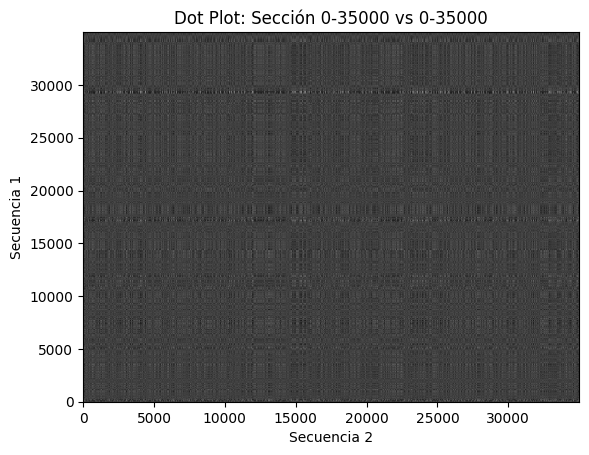

Tiempo de cálculo de la matriz: 6.3985137939453125 segundos


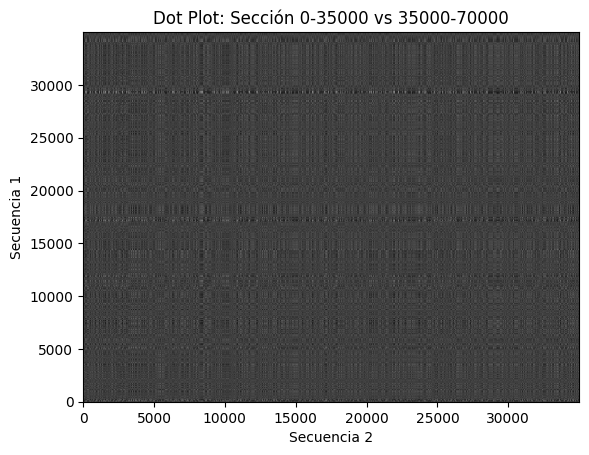

Tiempo de cálculo de la matriz: 6.485001802444458 segundos


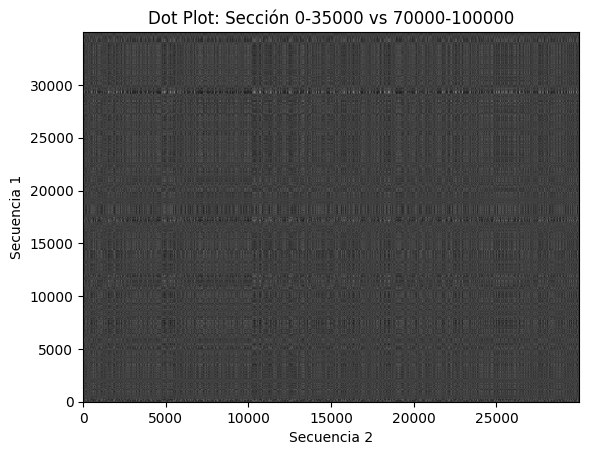

Processing:  33%|███▎      | 1/3 [01:54<03:49, 114.74s/it]

Tiempo de cálculo de la matriz: 5.59912109375 segundos


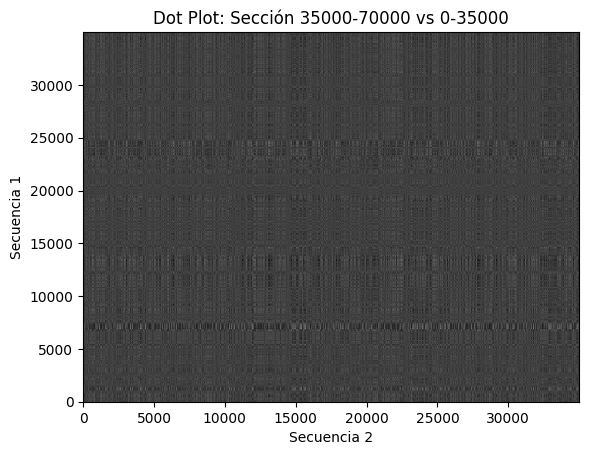

Tiempo de cálculo de la matriz: 7.0657477378845215 segundos


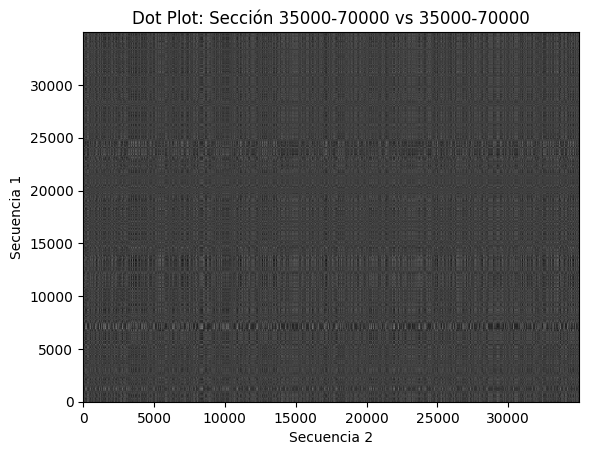

Tiempo de cálculo de la matriz: 6.748393535614014 segundos


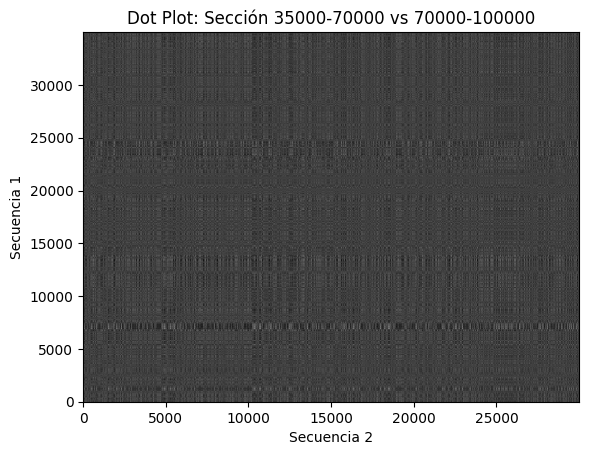

Processing:  67%|██████▋   | 2/3 [03:55<01:58, 118.15s/it]

Tiempo de cálculo de la matriz: 5.734498977661133 segundos


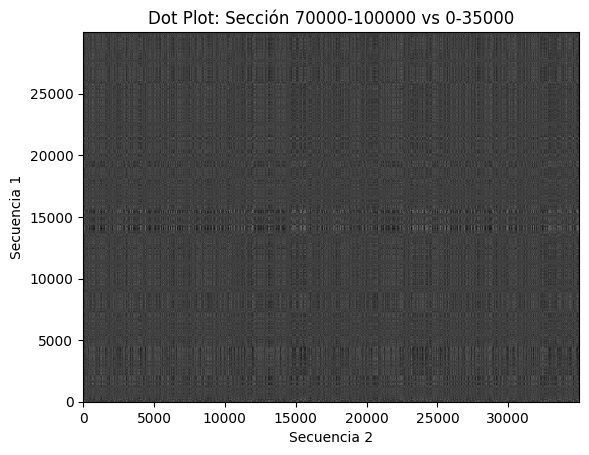

Tiempo de cálculo de la matriz: 5.630110263824463 segundos


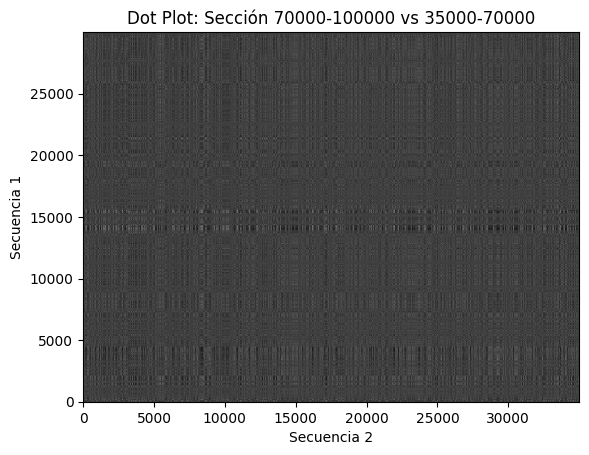

Tiempo de cálculo de la matriz: 6.094730377197266 segundos


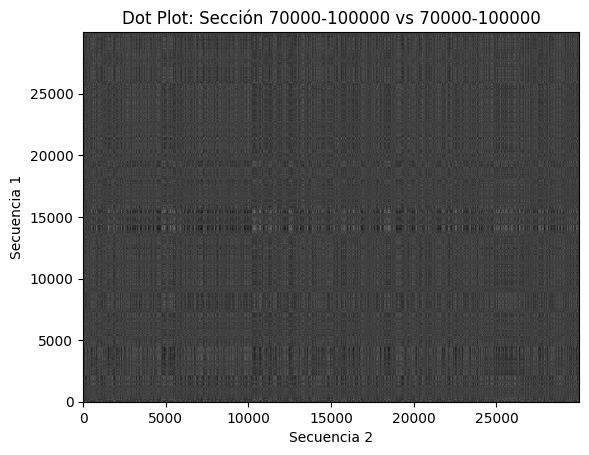

Processing: 100%|██████████| 3/3 [05:45<00:00, 115.24s/it]


Tiempo de cálculo de la matriz: 5.306516647338867 segundos
Tiempo total: 345.8353672027588 segundos


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

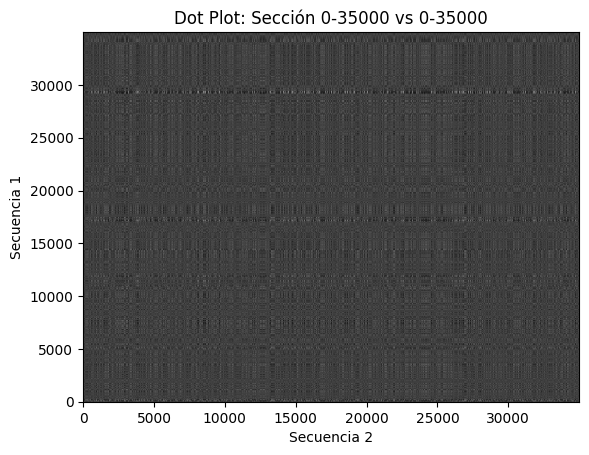

Tiempo de cálculo de la matriz: 6.8648998737335205 segundos


Processing:   0%|          | 0/3 [01:11<?, ?it/s]


KeyboardInterrupt: 

: 

In [1]:

import numpy as np
import matplotlib.pyplot as plt
from Bio import SeqIO
import time
from tqdm import tqdm

def create_dot_plot(seq1, seq2, window_size):
    length1 = len(seq1)
    length2 = len(seq2)

    dot_plot = np.zeros((length1, length2), dtype=np.int8)

    for i in tqdm(range(0, length1, window_size), desc="Processing"):
        for j in range(0, length2, window_size):
            start_i = i
            end_i = min(i + window_size, length1)
            start_j = j
            end_j = min(j + window_size, length2)

            section1 = np.array(list(seq1[start_i:end_i]))
            section2 = np.array(list(seq2[start_j:end_j]))

            # Medida de tiempo para calcular la matriz de puntuación
            start_time = time.time()  # Tiempo de inicio
            match_matrix = section1[:, np.newaxis] == section2
            end_time = time.time()  # Tiempo de finalización
            computation_time = end_time - start_time  # Tiempo de cálculo de la matriz

            dot_plot[start_i:end_i, start_j:end_j] = match_matrix.astype(np.int8)

            # Graficar el dot plot de la sección actual
            plt.imshow(dot_plot[start_i:end_i, start_j:end_j], cmap='gray', aspect='auto', origin='lower')
            plt.title(f"Dot Plot: Sección {start_i}-{end_i} vs {start_j}-{end_j}")
            plt.xlabel("Secuencia 2")
            plt.ylabel("Secuencia 1")
            plt.savefig(f"images/Section_{start_i}-{end_i}_vs_{start_j}-{end_j}.png")
            plt.show()
            # Medida de tiempo para generar la imagen del dot plot
            time.sleep(1)  # Agregar un tiempo muerto de 1 segundo

            print(f"Tiempo de cálculo de la matriz: {computation_time} segundos")

    return dot_plot

# Rutas de los archivos fasta
file1 = "Data/E_coli.fna"
file2 = "Data/Salmonella.fna"

# Tamaño de la ventana deslizante
window_size = 35000

# Lee las secuencias de los archivos fasta y limita su tamaño
sequences1 = [str(record.seq[:100000]) for record in SeqIO.parse(file1, "fasta")]
sequences2 = [str(record.seq[:100000]) for record in SeqIO.parse(file2, "fasta")]

# Itera sobre las secuencias
for sequence1 in sequences1:
    for sequence2 in sequences2:
        # Calcula el dot plot por secciones para cada par de secuencias
        start_time = time.time()  # Tiempo de inicio
        dot_plot = create_dot_plot(sequence1, sequence2, window_size)
        end_time = time.time()  # Tiempo de finalización
        execution_time = end_time - start_time  # Tiempo total de ejecución
        print(f"Tiempo total: {execution_time} segundos")

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

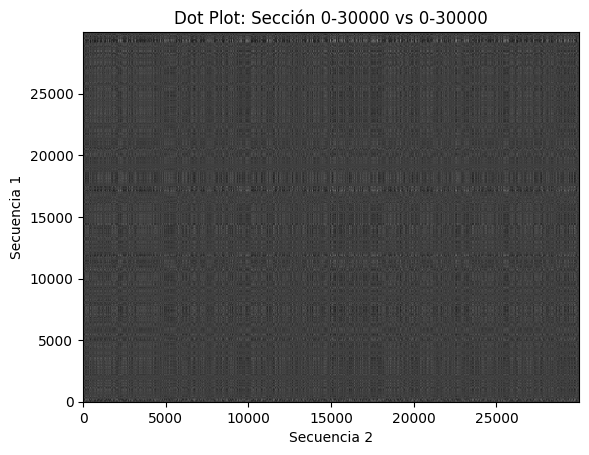

Tiempo de cálculo de la matriz: 5.063545227050781 segundos


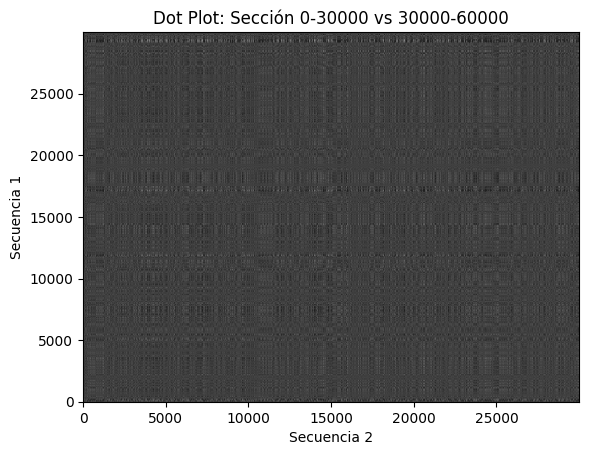

Tiempo de cálculo de la matriz: 5.13901948928833 segundos


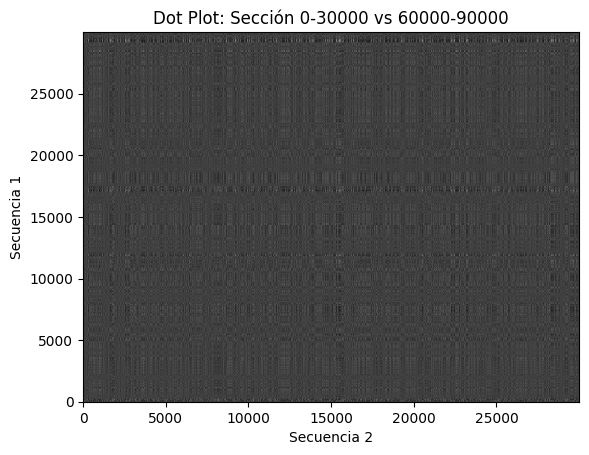

Tiempo de cálculo de la matriz: 5.208963394165039 segundos


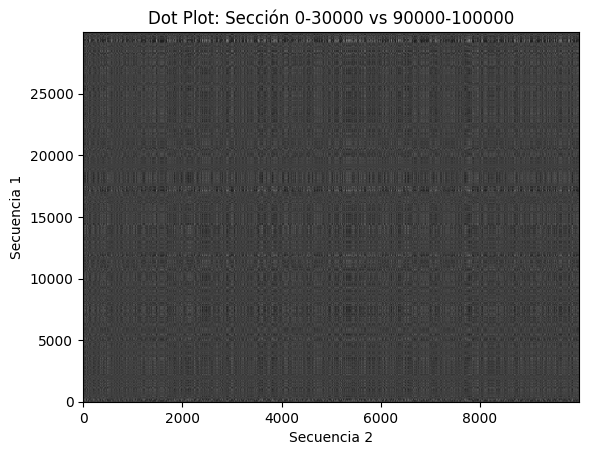

Processing:  25%|██▌       | 1/4 [02:58<08:56, 178.76s/it]

Tiempo de cálculo de la matriz: 2.018113613128662 segundos


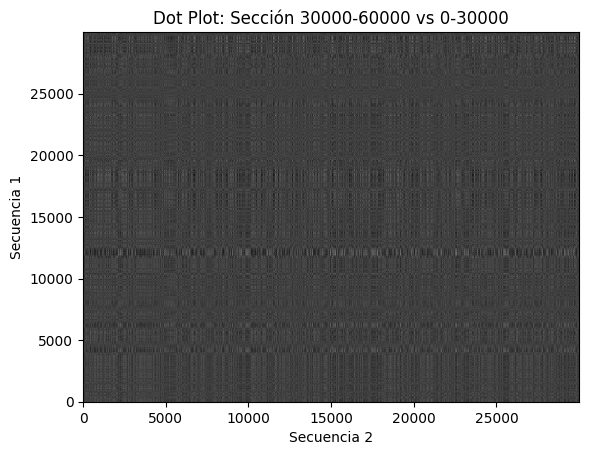

Tiempo de cálculo de la matriz: 5.013040781021118 segundos


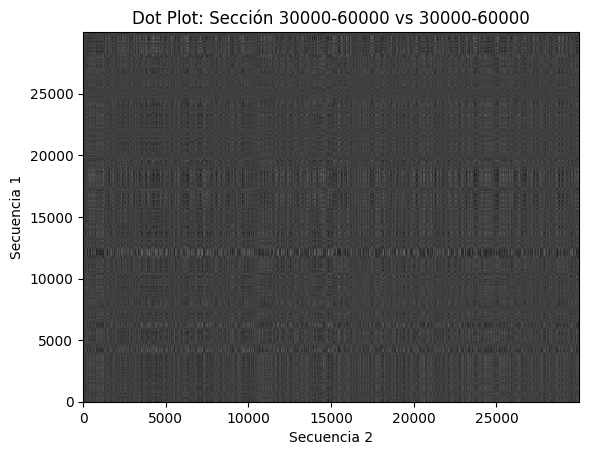

Tiempo de cálculo de la matriz: 5.079811334609985 segundos


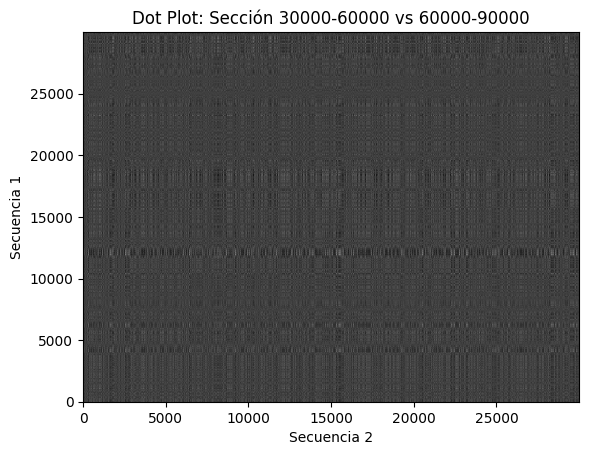

Tiempo de cálculo de la matriz: 5.029885292053223 segundos


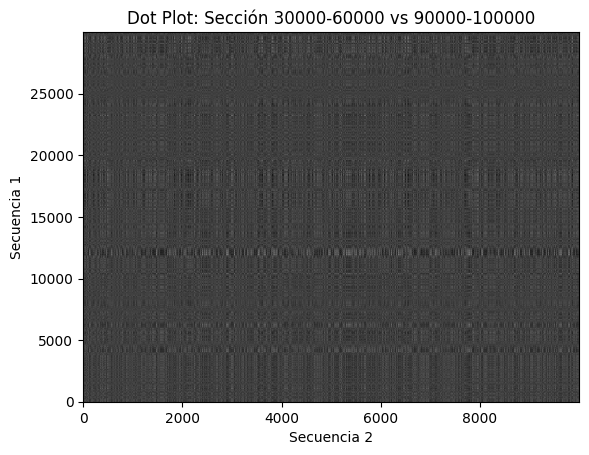

Processing:  50%|█████     | 2/4 [06:01<06:01, 180.85s/it]

Tiempo de cálculo de la matriz: 1.782897710800171 segundos


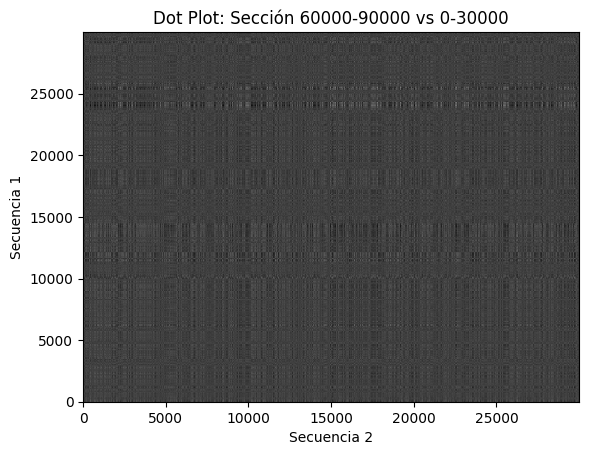

Tiempo de cálculo de la matriz: 5.030797481536865 segundos


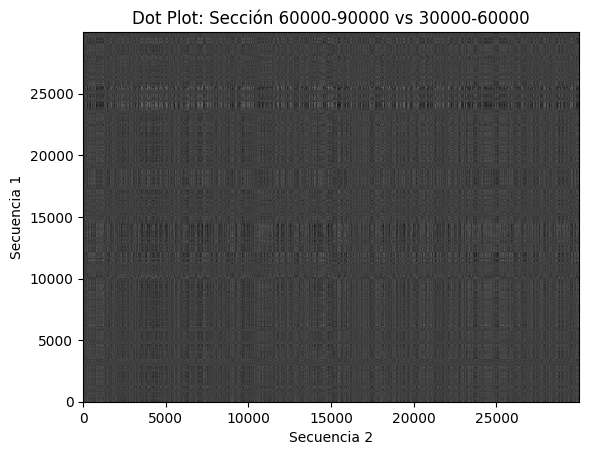

Tiempo de cálculo de la matriz: 5.514834403991699 segundos


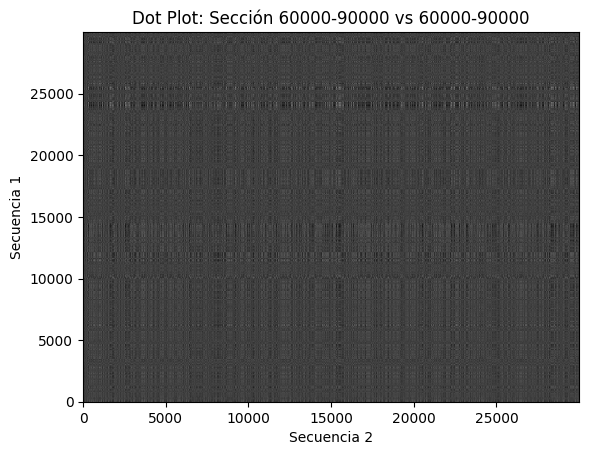

Tiempo de cálculo de la matriz: 5.657773017883301 segundos


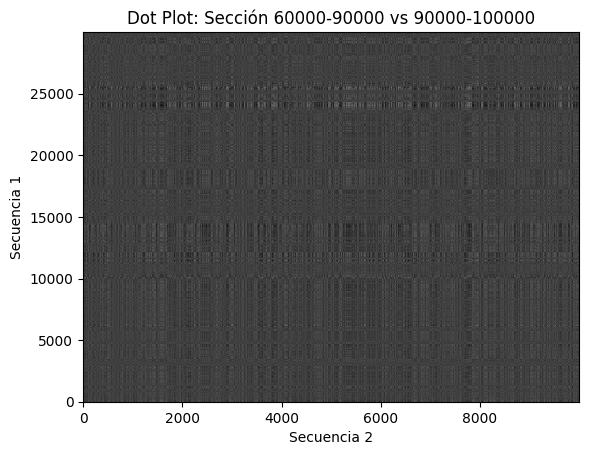

Processing:  75%|███████▌  | 3/4 [09:27<03:12, 192.38s/it]

Tiempo de cálculo de la matriz: 1.8552610874176025 segundos


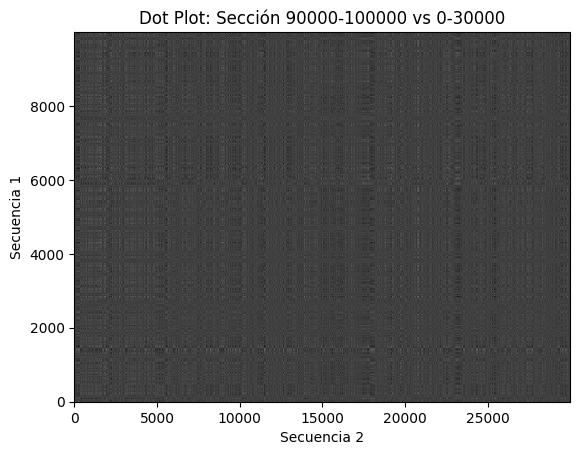

Tiempo de cálculo de la matriz: 1.8468503952026367 segundos


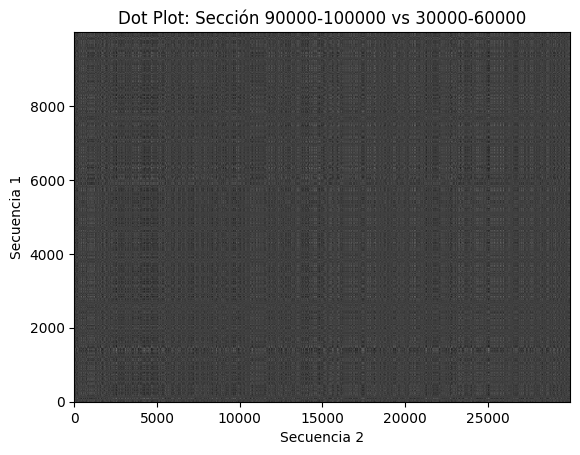

Tiempo de cálculo de la matriz: 1.8030877113342285 segundos


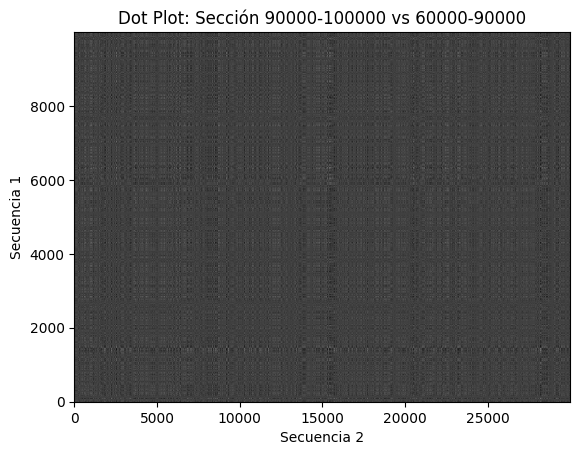

Tiempo de cálculo de la matriz: 1.6868302822113037 segundos


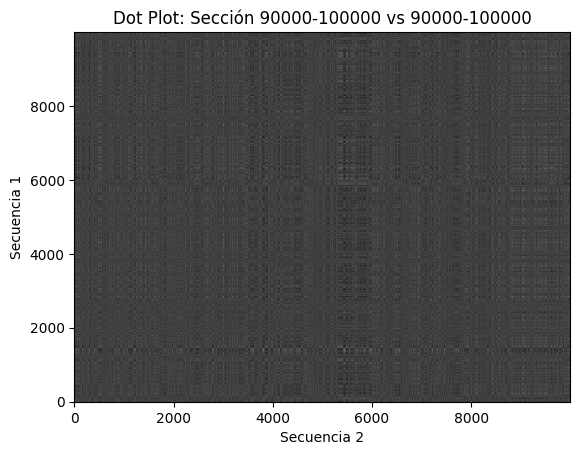

Processing: 100%|██████████| 4/4 [10:40<00:00, 160.07s/it]

Tiempo de cálculo de la matriz: 0.6690385341644287 segundos
Tiempo total: 640.3059892654419 segundos



Processing:   0%|          | 0/4 [00:00<?, ?it/s]

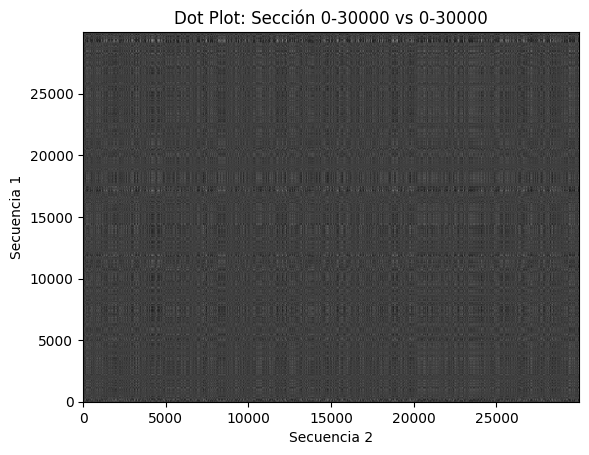

Tiempo de cálculo de la matriz: 5.775099039077759 segundos


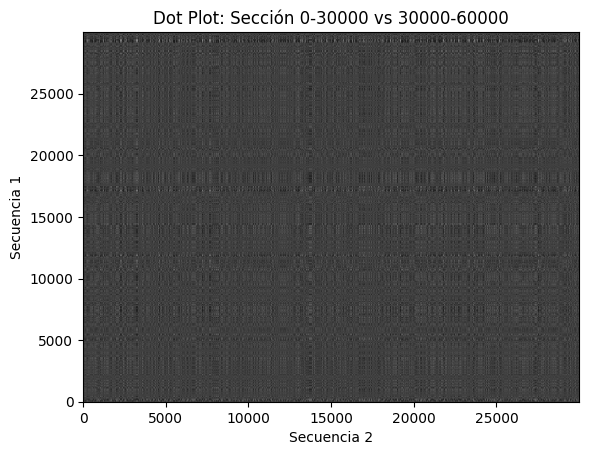

Tiempo de cálculo de la matriz: 5.484286785125732 segundos


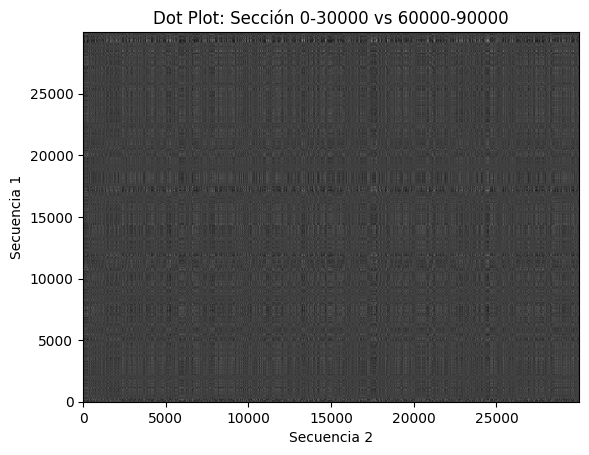

Tiempo de cálculo de la matriz: 5.831574201583862 segundos


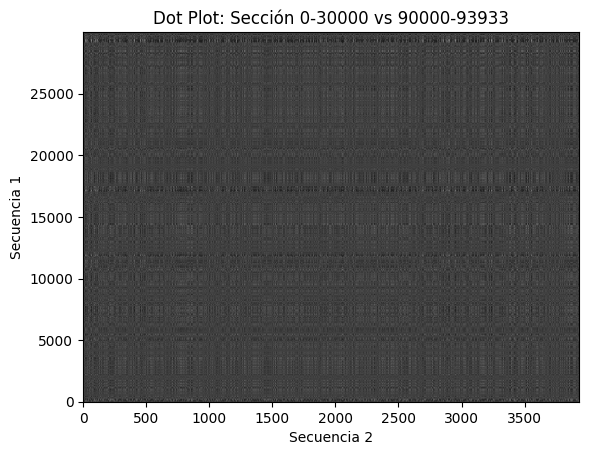

Processing:  25%|██▌       | 1/4 [03:16<09:48, 196.12s/it]

Tiempo de cálculo de la matriz: 0.9681096076965332 segundos


Processing:  25%|██▌       | 1/4 [03:51<11:35, 231.99s/it]


KeyboardInterrupt: 

In [1]:

import numpy as np
import matplotlib.pyplot as plt
from Bio import SeqIO
import time
from tqdm import tqdm

def create_dot_plot(seq1, seq2, window_size):
    length1 = len(seq1)
    length2 = len(seq2)

    dot_plot = np.zeros((length1, length2), dtype=np.int8)

    for i in tqdm(range(0, length1, window_size), desc="Processing"):
        for j in range(0, length2, window_size):
            start_i = i
            end_i = min(i + window_size, length1)
            start_j = j
            end_j = min(j + window_size, length2)

            section1 = np.array(list(seq1[start_i:end_i]))
            section2 = np.array(list(seq2[start_j:end_j]))

            # Medida de tiempo para calcular la matriz de puntuación
            start_time = time.time()  # Tiempo de inicio
            match_matrix = section1[:, np.newaxis] == section2
            end_time = time.time()  # Tiempo de finalización
            computation_time = end_time - start_time  # Tiempo de cálculo de la matriz

            dot_plot[start_i:end_i, start_j:end_j] = match_matrix.astype(np.int8)

            # Graficar el dot plot de la sección actual
            plt.imshow(dot_plot[start_i:end_i, start_j:end_j], cmap='gray', aspect='auto', origin='lower')
            plt.title(f"Dot Plot: Sección {start_i}-{end_i} vs {start_j}-{end_j}")
            plt.xlabel("Secuencia 2")
            plt.ylabel("Secuencia 1")
            plt.savefig(f"images4/Section_{start_i}-{end_i}_vs_{start_j}-{end_j}.png")
            plt.show()
            # Medida de tiempo para generar la imagen del dot plot
            time.sleep(1)  # Agregar un tiempo muerto de 1 segundo

            print(f"Tiempo de cálculo de la matriz: {computation_time} segundos")

    return dot_plot

# Rutas de los archivos fasta
file1 = "Data/E_coli.fna"
file2 = "Data/Salmonella.fna"

# Tamaño de la ventana deslizante
window_size = 30000

# Lee las secuencias de los archivos fasta y limita su tamaño
sequences1 = [str(record.seq[:100000]) for record in SeqIO.parse(file1, "fasta")]
sequences2 = [str(record.seq[:100000]) for record in SeqIO.parse(file2, "fasta")]

# Itera sobre las secuencias
for sequence1 in sequences1:
    for sequence2 in sequences2:
        # Calcula el dot plot por secciones para cada par de secuencias
        start_time = time.time()  # Tiempo de inicio
        dot_plot = create_dot_plot(sequence1, sequence2, window_size)
        end_time = time.time()  # Tiempo de finalización
        execution_time = end_time - start_time  # Tiempo total de ejecución
        print(f"Tiempo total: {execution_time} segundos")